In [1]:
#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('gzh_3_23_with_urls.fits')

#current threshold values:
cuts=Table.read('gzh_cuts.fits')


# Task 07: How rounded is it?



Task 01: Is the galaxy smooth or featured? (answer smooth) 



In [2]:
# Task 3:  Bar

#First define the task in question:
p_completely = 't07_rounded_a01_completely_round_weighted_fraction' # vote fraction for task
p_between = 't07_rounded_a02_in_between_weighted_fraction' # vote fraction for task
p_cigar = 't07_rounded_a03_cigar_shaped_weighted_fraction' # vote fraction for task
N_rounded = 't07_rounded_total_weight' # number of votes for task

#and the previous tasks:
p_smooth = 't01_smooth_or_features_a01_smooth_best_fraction' # vote fraction for previous task

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_rounded]>=N_cut)



# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_completely=[]
err_list_completely=[]
fraction_list_between=[]
err_list_between=[]
fraction_list_cigar=[]
err_list_cigar=[]



for p in p_prev_task_list:
    task_data = (data[p_smooth]>p-.05) & (data[p_smooth]<p+.05) & min_N 

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_completely.append(np.nanmean(data[task_data][p_completely]))
    fraction_list_between.append(np.nanmean(data[task_data][p_between]))
    fraction_list_cigar.append(np.nanmean(data[task_data][p_cigar]))



    try:
        err_list_completely.append(np.nanstd(data[task_data][p_completely])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_completely.append(0)
    try:
        err_list_between.append(np.nanstd(data[task_data][p_between])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_between.append(0)
    try:
        err_list_cigar.append(np.nanstd(data[task_data][p_cigar])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_cigar.append(0)


y1_completely = [f+e for f,e in zip(fraction_list_completely,err_list_completely)]
y2_completely = [f-e for f,e in zip(fraction_list_completely,err_list_completely)]

y1_between = [f+e for f,e in zip(fraction_list_between,err_list_between)]
y2_between = [f-e for f,e in zip(fraction_list_between,err_list_between)]


y1_cigar = [f+e for f,e in zip(fraction_list_cigar,err_list_cigar)]
y2_cigar = [f-e for f,e in zip(fraction_list_cigar,err_list_cigar)]




(0, 1)

/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


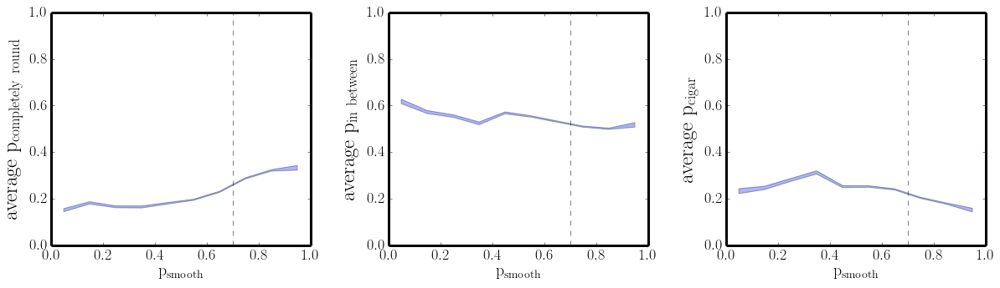

In [3]:
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

p_smooth_cut = 0.7

f=plt.figure(figsize=(20,5))
gs=gridspec.GridSpec(1,3)
gs.update(wspace=.3)

plt.subplot(gs[0,0])
plt.plot(p_prev_task_list,y1_completely,alpha=.1)
plt.plot(p_prev_task_list,y2_completely,alpha=.1)
plt.fill_between(p_prev_task_list,y1_completely,y2_completely,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{completely~round}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{smooth}}$',fontsize=20)
plt.axvline(x=p_smooth_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)
plt.ylim(0,1)

plt.subplot(gs[0,1])
plt.plot(p_prev_task_list,y1_between,alpha=.1)
plt.plot(p_prev_task_list,y2_between,alpha=.1)
plt.fill_between(p_prev_task_list,y1_between,y2_between,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{in~between}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{smooth}}$',fontsize=20)
plt.axvline(x=p_smooth_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)
plt.ylim(0,1)

plt.subplot(gs[0,2])
plt.plot(p_prev_task_list,y1_cigar,alpha=.1)
plt.plot(p_prev_task_list,y2_cigar,alpha=.1)
plt.fill_between(p_prev_task_list,y1_cigar,y2_cigar,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{cigar}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{smooth}}$',fontsize=20)
plt.axvline(x=p_smooth_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)
plt.ylim(0,1)

## Below: Visually inspect galaxies for "roundedness candidates" - galaxies for which asking the rounded question makes physical sense. These should be smooth/elliptical.


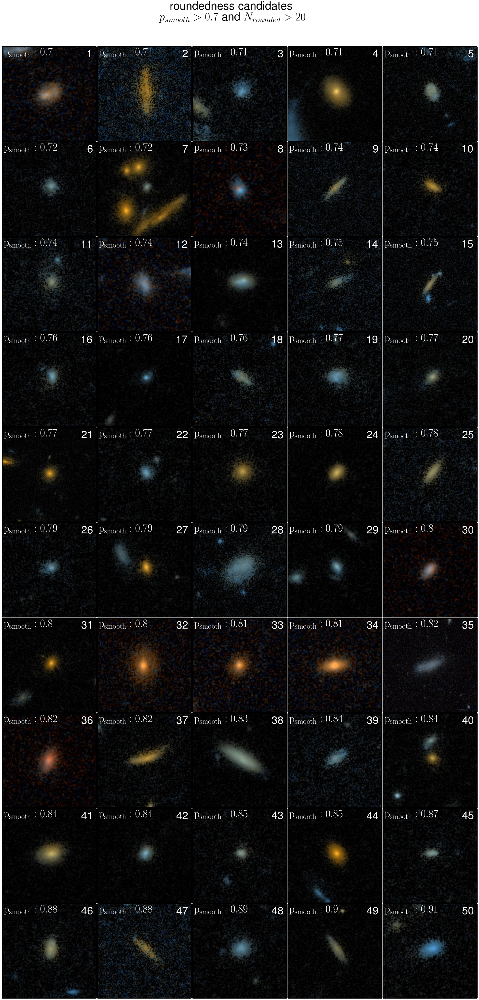

In [4]:
smooth =(data[p_smooth]>p_smooth_cut)

gs=gridspec.GridSpec(10,5)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= smooth & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.seed(3)
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 50
random_n_list = n_list[0:n_gals]

labels = np.linspace(1,50,50)

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_smooth, column 9
random_gal_list.sort(key=itemgetter(9))

f=plt.figure(figsize=(30,60))
n=0
for i in range (0,10):
    for j in range(0,5):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{smooth}: %s}$'%round(gal[p_smooth],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('%s'%int(labels[n]),fontsize=38,xy=(0.97,0.97),
            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')

        n+=1
        

f.text(.5,.92,'roundedness candidates\n$p_{smooth} > %s$ and $N_{rounded}>20$'%p_smooth_cut, fontsize=40,ha='center')





## Mel visually inspected the rounded candidates. 

Galaxies that she considered  rounded  candidates (smooth galaxies): 

Galaxies she considered  rounded  candidates (disks/irregular): 5,9 

Galaxies she considered uncertain (fuzzy blobs): 1, 2, 3, 8, 14, 18, 37, 39


##   80 % of galaxies in this subsample are rounded candidates. 

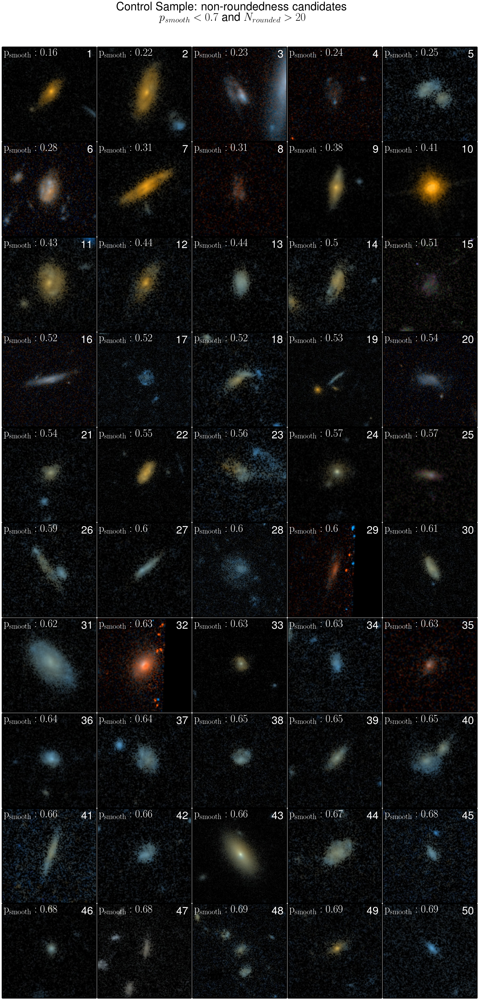

In [5]:
not_smooth =(data[p_smooth]<p_smooth_cut)

gs=gridspec.GridSpec(10,5)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= not_smooth & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.seed(3)
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 50
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_smooth, column 9
random_gal_list.sort(key=itemgetter(9))

f=plt.figure(figsize=(30,60))
n=0
for i in range (0,10):
    for j in range(0,5):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{smooth}: %s}$'%round(gal[p_smooth],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('%s'%int(labels[n]),fontsize=38,xy=(0.97,0.97),
            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')

        n+=1
        

f.text(.5,.92,'Control Sample: non-roundedness candidates\n$p_{smooth} <%s$ and $N_{rounded}>20$'%p_smooth_cut, fontsize=40,ha='center')





## Mel visually inspected the non- rounded candidates. 

Galaxies that she considered  rounded  candidates (smooth galaxies): 43

Galaxies she considered  rounded  candidates (disks/irregular):  

Galaxies she considered uncertain (fuzzy blobs): 13, 34, 46


##  92 % of galaxies in this subsample are not good rounded candidates. 

In [16]:
cuts['p_smooth_cut']=p_smooth_cut

newtable = cuts.copy(copy_data=True)
fname = 'gzh_cuts.fits'
if os.path.exists(fname):
    os.remove(fname)
newtable.write(fname,format='fits')